<a href="https://colab.research.google.com/drive/1MGeJuE8VYj2T_RN5vxYBpigMeAxyZ6Yw?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

By [Ibrahim Sobh](https://www.linkedin.com/in/ibrahim-sobh-phd-8681757/)

# Optimize a random input image in a way to have the same activations of another image (using a pre-trained network)

The basic idea to trying to get an image that produce almost the same activations of another image. In other words, both images are almost the same in the eyes of the neural network. 

## Steps:
- Feed an image to the network
- Select a layer 
- Record the activations 
- Start with a random input image
- Keep the network weights fixed
- Use gradient descent to update the input image in the direction to minimize the distance between its activations and the recorded one 
- Plot the image
- Predict the image to see how the network sees it


## Pre trained Networks
- VGG16

In [0]:
import time
import numpy as np
from PIL import Image as pil_image
from keras.preprocessing import image
from keras import layers
from keras import applications
from keras.applications import vgg16
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras import backend as K
import matplotlib.pyplot as plt
import imageio
from tqdm import tqdm_notebook as tqdm

In [18]:
# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x
print(K.image_data_format())

channels_last


In [19]:
# build the VGG16 network
model = applications.VGG16(include_top=True, weights='imagenet')  # Pre-trained network

# get the symbolic outputs of each "key" layer
layer_dict = dict([(layer.name, layer) for layer in model.layers])

for layer in model.layers:
  print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
flatten
fc1
fc2
predictions


2020-05-10 20:11:32 URL:https://devblogs.nvidia.com/wp-content/uploads/2016/07/cute-300x225.jpg [19126/19126] -> "cat.jpg" [1]


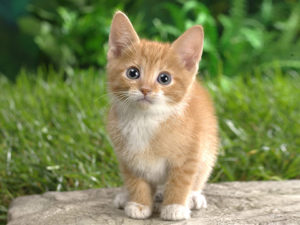

In [20]:
# load an image
!wget -nv https://devblogs.nvidia.com/wp-content/uploads/2016/07/cute-300x225.jpg -O cat.jpg

img = pil_image.open('./cat.jpg')
img

In [21]:
img_path = './cat.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
print('image.img_to_array: ', x.shape, np.max(x), np.min(x))
x = np.expand_dims(x, axis=0)
print('expand_dims: ', x.shape, np.max(x), np.min(x))
x = preprocess_input(x)
print('preprocess_input: ', x.shape, np.max(x), np.min(x))

image.img_to_array:  (224, 224, 3) 255.0 0.0
expand_dims:  (1, 224, 224, 3) 255.0 0.0
preprocess_input:  (1, 224, 224, 3) 151.061 -117.68


In [22]:
# here we select layer fc2
activations = layer_dict['fc2'].output
print(activations.shape)
get_activations = K.function([model.input], [activations])

(None, 4096)


In [23]:
activations_value = get_activations([x])
print(activations_value[0].shape, np.min(activations_value[0]), np.max(activations_value[0]), np.sum(activations_value[0]))

(1, 4096) 0.0 10.834147 1983.334


(1, 224, 224, 3) 0 254
(1, 224, 224, 3) -123.68 150.061


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


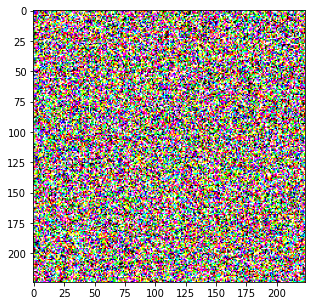

In [24]:
img_width = 224
img_height  = 224

# we start from a random image
input_img_data = np.random.randint(0,255,(1, img_width, img_height, 3))
print(input_img_data.shape, np.min(input_img_data), np.max(input_img_data))
input_img_data = vgg16.preprocess_input(input_img_data)
print(input_img_data.shape, np.min(input_img_data), np.max(input_img_data))

plt.figure(figsize=(5,5))
plt.imshow(input_img_data[0])

In [0]:
# the loss is the distancce between the network output activations and the desired one
loss = K.mean(K.square(10.0*(layer_dict['fc2'].output - activations_value[0]))) 

In [0]:
# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss, model.input)[0]
# normalization trick: we normalize the gradient
grads /= K.std(grads) + 1e-8
# this function returns the loss and grads given the input picture
iterate = K.function([model.input], [loss, grads])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


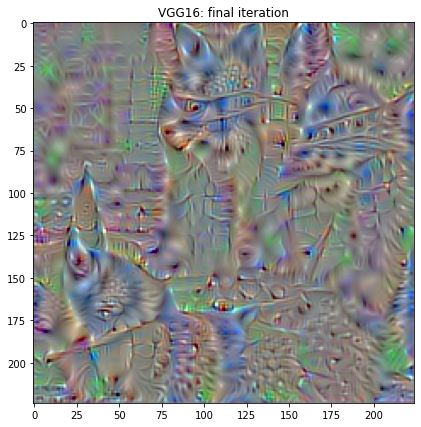

In [27]:
# run gradient descent for n steps
images = []
loss_list = []
for i in tqdm(range(700)):
    loss_value, grads_value = iterate([input_img_data])
    # print(loss_value)
    loss_list.append(loss_value)
    input_img_data -= grads_value * 0.005
    if(i%5 == 0):
      #print(i, loss_value, np.mean(grads_value), np.std(grads_value))
      img = input_img_data[0]
      img = deprocess_image(img)
      images.append(img)

img = input_img_data[0]
img = deprocess_image(img)
images.append(img)
plt.figure(figsize=(7,7))
plt.title('VGG16: final iteration')
plt.imshow(img)

In the figure above, it is clear that the optimized image has some sort of  the original image fingre print. Both images, the original and the optimized have almost the same activations at the selected layer. 

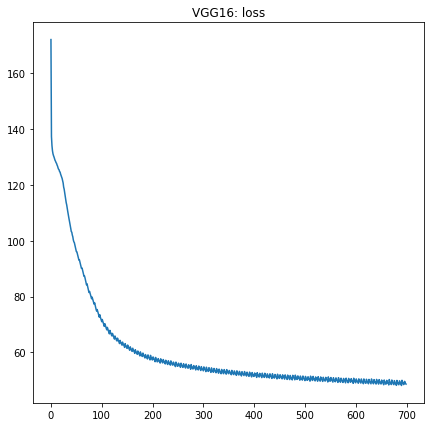

In [28]:
# plot the loss
plt.figure(figsize=(7,7))
plt.title('VGG16: loss')
plt.plot(loss_list)

## Now we predict both images

- The optimized image is recognized by the network with a much higher probability compared to the original image. The main reason is the optimization process applied on the fc2 layer.


In [29]:
# predict the target image
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n02119789', 'kit_fox', 0.25400794), ('n02119022', 'red_fox', 0.20924433), ('n02124075', 'Egyptian_cat', 0.16243257)]


In [30]:
# predict the generated image
img_view = np.expand_dims(img, axis=0)
preds = model.predict(img_view)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n02119789', 'kit_fox', 0.97977954), ('n02119022', 'red_fox', 0.020204775), ('n02123159', 'tiger_cat', 1.4226715e-05)]


## Let's see the optimization over time as animated gif

In [0]:
imageio.mimsave('./vgg16.gif', images[:400])

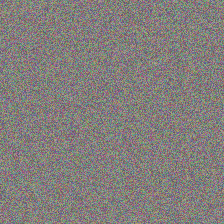

In [32]:
from IPython.display import Image
with open('./vgg16.gif','rb') as f:
    display(Image(data=f.read(), format='png'))